In [2]:
using Plots
using Interpolations
using Optim

In [3]:
# 1a

#There are four functions

function f1(x)
    return exp(2*x + 2) #exponential function
end

function f2(x)
    return min(max(-1, 4 * (x - (1/5))), 1) #piecewise function
end

function f3(x)
    return -2 * x^(-1/2) #power function
end

function f4(x)
    return 1 / (1 + x^2) #rational function
end

nodes = [5, 10, 20, 50, 100]

#larger grid - more accurate approximation (but more computationally intensive)

#Approximate each of these functions with Chebyshev polynomials, Lagrange polynomials, linear interpolation, and cubic splines1
# . Try a variety of grid sizes (n = 5, 10, 20, 50, 100) and plot the resulting
# approximations against the true function.
# you will need to write your own implementation of Chebyshev polynomials and Lagrange interpolation to do this, however you should feel free to use a standard implementation of linear interpolation/cubic
# splines.
#Plot the approximation error f − ˆf over the relevant domains.

5-element Vector{Int64}:
   5
  10
  20
  50
 100

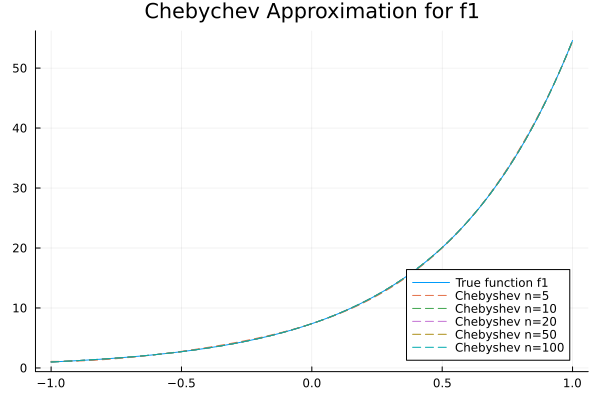

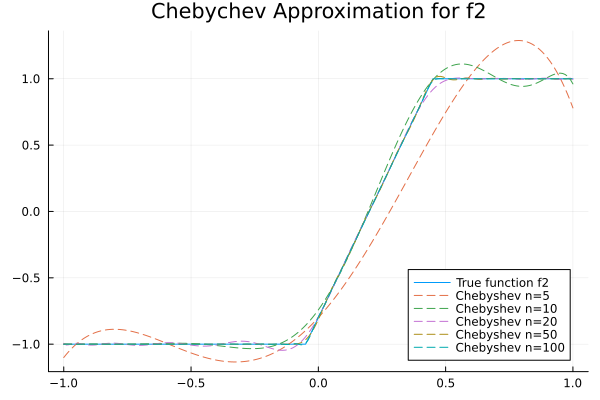

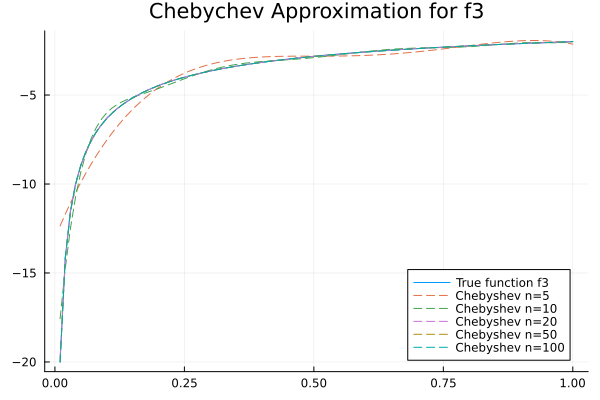

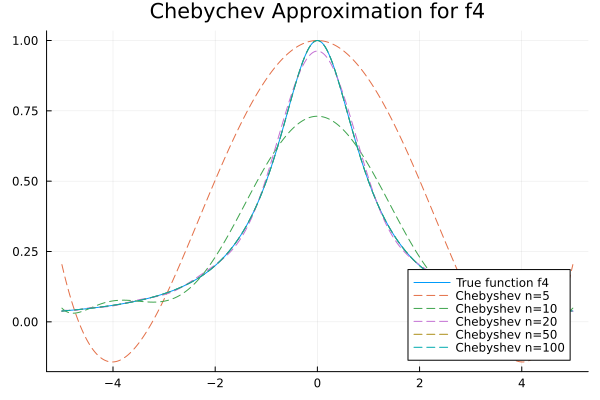

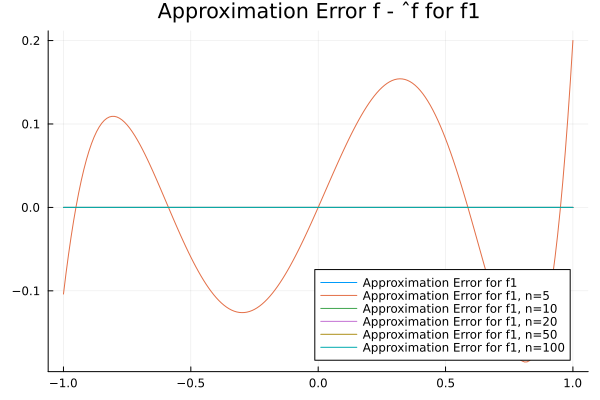

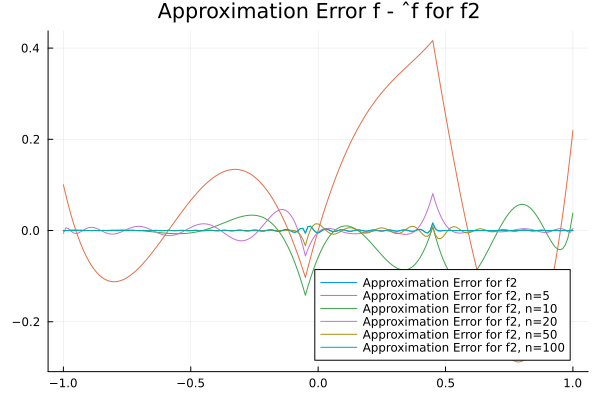

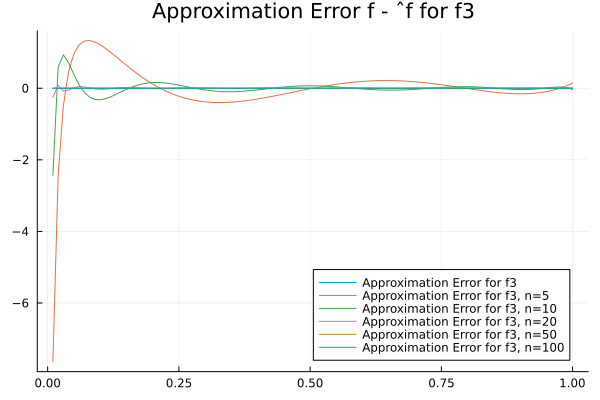

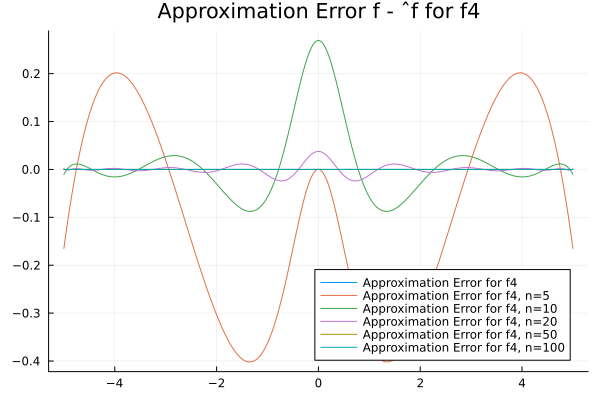

In [4]:
#Chebyshev - uses the roots of Chebychev polynomials as nodes to approximate the function. Not equally spaced, but minimizes the error

funcs = [(f1, "f1", (-1, 1)), (f2, "f2", (-1, 1)), (f3, "f3", (0.01, 1)), (f4, "f4", (-5, 5))]

domains = Dict(
    "f1" => (-1, 1),
    "f2" => (-1, 1),
    "f3" => (0.01, 1),
    "f4" => (-5, 5)
)

T(n, x) = cos(n * acos(x))

function chebyshev_nodes(n)
    return [cos(π * (2*k - 1) / (2*n)) for k = 1:n]
end

function chebyshev_coefficients(f, n, a, b)
    nodes = chebyshev_nodes(n)
    transformed_nodes = (nodes .+ 1) .* (b - a) / 2 .+ a
    y = f.(transformed_nodes)
    c = [2/n * sum(y .* cos.(j * acos.(nodes))) for j in 0:n-1]
    c[1] /= 2
    return c
end

# function chebyshev_approximation(f, n, x, a, b)
#      x_scaled = 2 * (x - a) / (b - a) - 1
#      c = chebyshev_coefficients(f, n, a, b)
#      return sum([c[k+1] * T(k, x_scaled) for k = 0:n-1])
# end

function chebyshev_approximation(f, n, x, a, b)
    x_scaled = 2 * (x - a) / (b - a) - 1
    if x_scaled < -1 || x_scaled > 1
         println("Invalid x_scaled: $x_scaled")
    end
    c = chebyshev_coefficients(f, n, a, b)
    return sum([c[k+1] * T(k, x_scaled) for k = 0:n-1])
 end

for (func, label, (a, b)) in funcs
    p = plot(a:0.01:b, x -> func(x), label = "True function $label", title = "Chebychev Approximation for $label", legend=:bottomright)
    for n in nodes
        domain = label == "f3" ? (0.01:0.01:1) : (a:0.01:b)
        plot!(p, domain, x -> chebyshev_approximation(func, n, x, a, b), label = "Chebyshev n=$n", linestyle=:dash)
    end
    display(p)
end

errors = Dict()

for (func, label, (a, b)) in funcs
    p = plot(a:0.01:b, x -> func(x) - chebyshev_approximation(func, nodes[end], x, a, b), 
             label = "Approximation Error for $label", 
             title = "Approximation Error f - ˆf for $label", 
             legend=:bottomright)
    
    for n in nodes
        domain = label == "f3" ? (0.01:0.01:1) : (a:0.01:b)
        plot!(p, domain, x -> func(x) - chebyshev_approximation(func, n, x, a, b), label = "Approximation Error for $label, n=$n")
    end
    
    display(p)
end

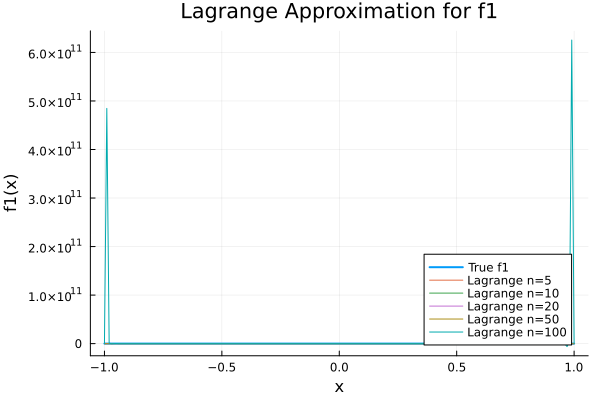

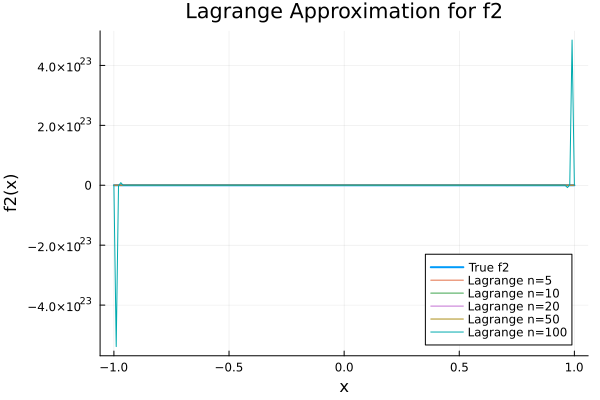

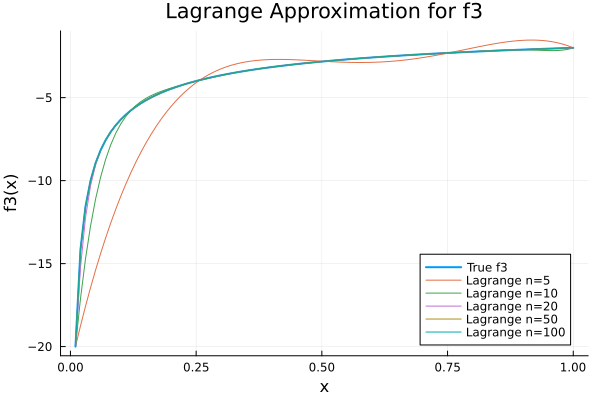

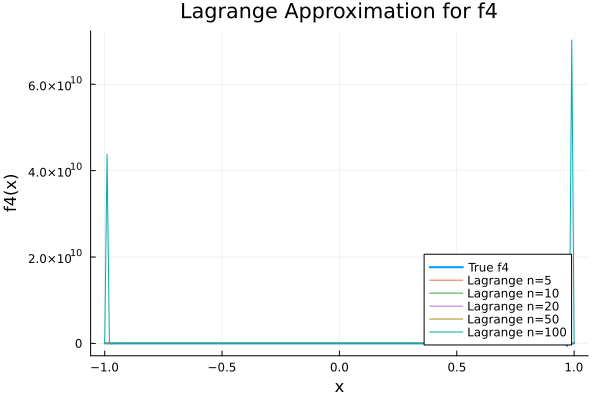

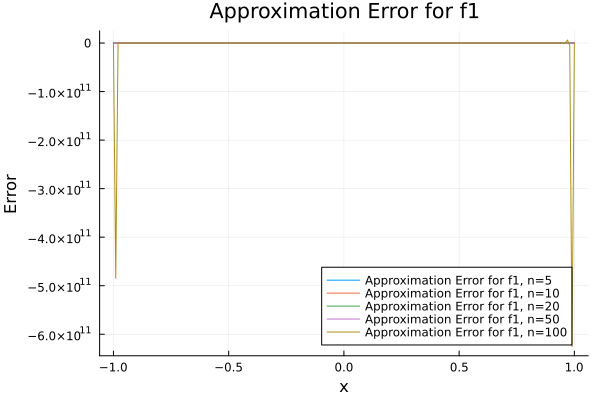

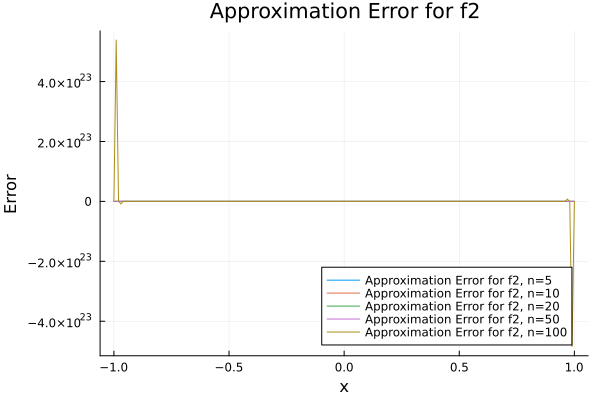

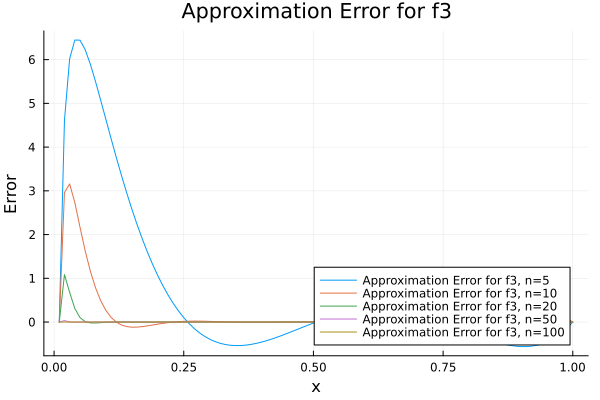

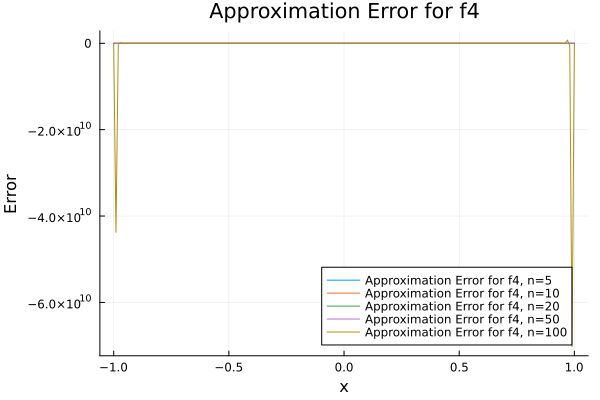

In [5]:
# Lagrange polynomials - equally spaced nodes (can lead to large errors)

# Graphs are very strange - Runge's phenomenon (oscillations at the edges of the domain)
# Only f3 is approximated correctly

function lagrange_basis(X, k, x)
    n = length(X)
    result = 1.0
    for i = 1:n
        if i != k
            result *= (x - X[i]) / (X[k] - X[i])
        end
    end
    return result
end

function lagrange_interpolate(X, Y, x)
    n = length(X)
    result = 0.0
    for i = 1:n
        result += Y[i] * lagrange_basis(X, i, x)
    end
    return result
end

for (func, label) in funcs
    p = plot(title = "Lagrange Approximation for $label", xlabel = "x", ylabel = "$label(x)", legend=:bottomright)
    domain = label == "f3" ? (0.01:0.01:1) : (-1:0.01:1) 
    plot!(p, domain, x->func(x), label="True $label", lw=2)
    
    for n in nodes
        X = label == "f3" ? LinRange(0.01, 1, n) : LinRange(-1, 1, n)
        Y = func.(X)
        plot!(p, domain, x->lagrange_interpolate(X, Y, x), label="Lagrange n=$n")
    end
    
    display(p)
end

# Large n - large oscillations at the edges of the domain - error. 
# I want to try to plot some with a smaller n

#nodes_test = [5, 10]

# function lagrange_basis(X, k, x)
#     n = length(X)
#     result = 1.0
#     for i = 1:n
#         if i != k
#             result *= (x - X[i]) / (X[k] - X[i])
#         end
#     end
#     return result
# end

# function lagrange_interpolate(X, Y, x)
#     n = length(X)
#     result = 0.0
#     for i = 1:n
#         result += Y[i] * lagrange_basis(X, i, x)
#     end
#     return result
# end

# for (func, label) in funcs
#     p = plot(title = "Lagrange Approximation for $label", xlabel = "x", ylabel = "$label(x)", legend=:bottomright)
#     domain = label == "f3" ? (0.01:0.01:1) : (-1:0.01:1) 
#     plot!(p, domain, x->func(x), label="True $label", lw=2)
    
#     for n in nodes_test
#         X = label == "f3" ? LinRange(0.01, 1, n) : LinRange(-1, 1, n)
#         Y = func.(X)
#         plot!(p, domain, x->lagrange_interpolate(X, Y, x), label="Lagrange n=$n")
#     end
    
#     display(p)
# end

errors = Dict()

for (func, label) in funcs
    p = plot(title = "Approximation Error for $label", xlabel = "x", ylabel = "Error", legend=:bottomright)
    domain = label == "f3" ? (0.01:0.01:1) : (-1:0.01:1) 
    
    for n in nodes
        X = label == "f3" ? LinRange(0.01, 1, n) : LinRange(-1, 1, n)
        Y = func.(X)
        plot!(p, domain, x -> func(x) - lagrange_interpolate(X, Y, x), label = "Approximation Error for $label, n=$n")
    end
    
    display(p)
end

Lagrange polynomials are not a good approximation for f1, f2, and f4. They are a good approximation for f3. This is because of Runge's phenomenon, which causes large oscillations at the edges of the domain when n is very large. I plotted some tests of n when it is small (n=5,10) and it worked fine, above 20 started to oscillate. (I won't print those out here for the sake of space).

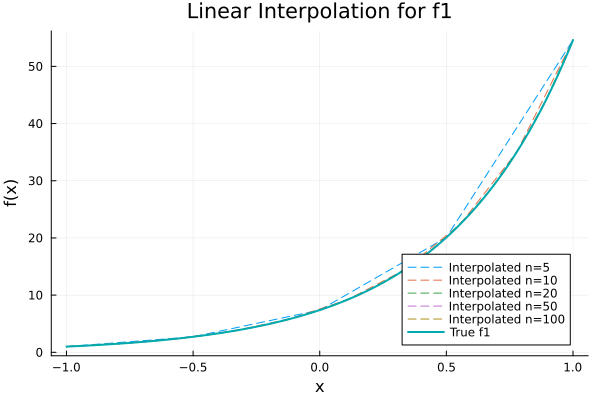

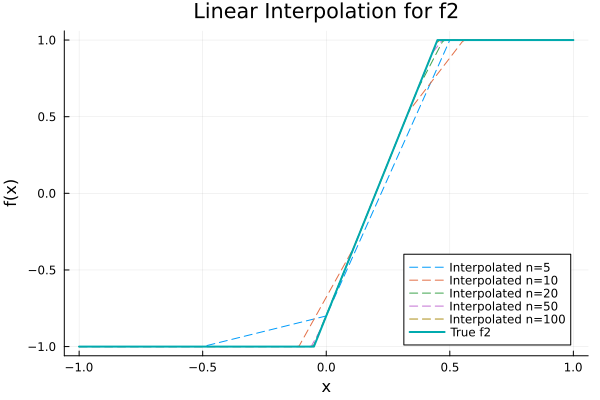

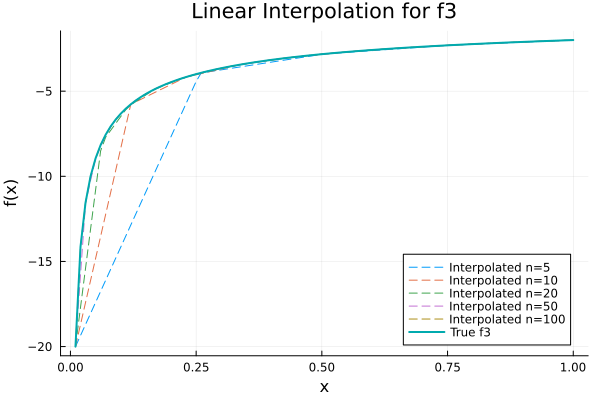

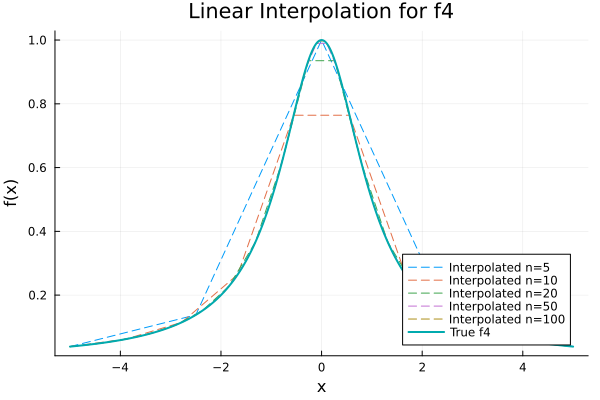

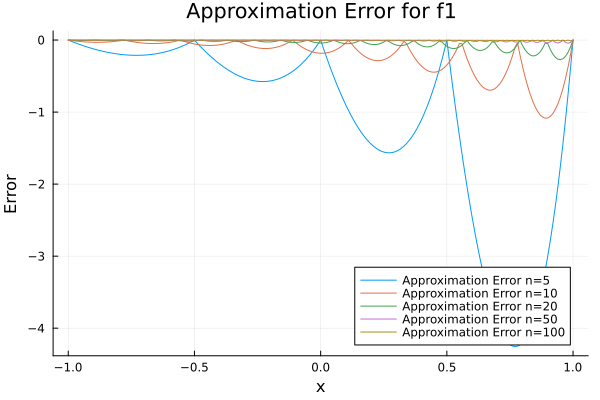

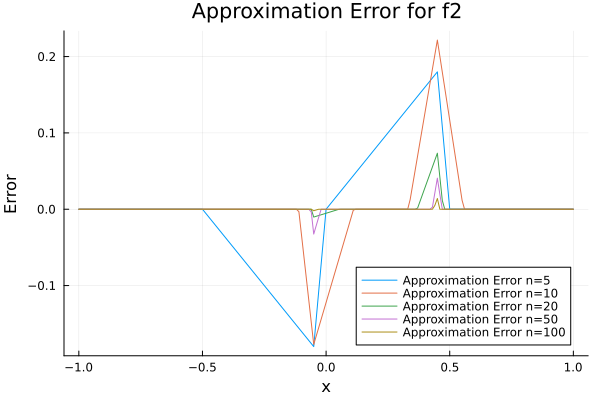

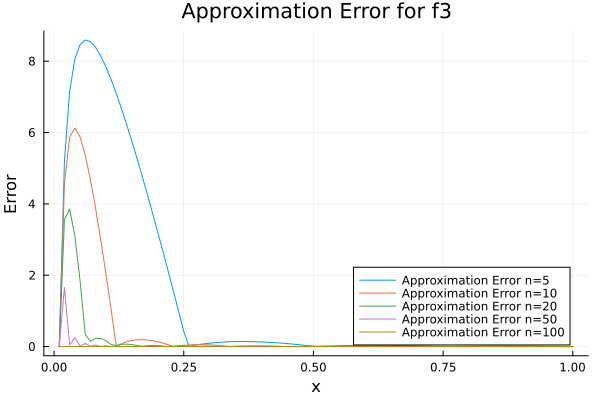

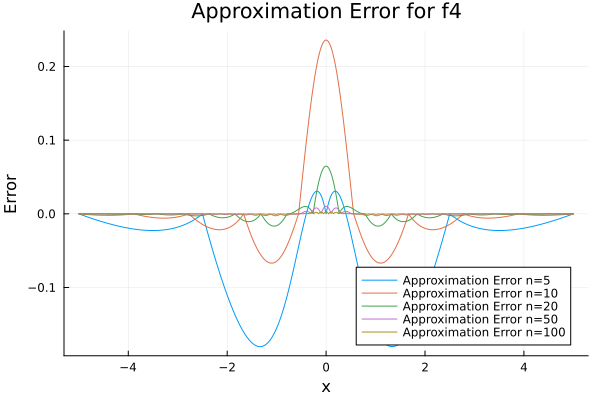

In [6]:
# Linear interpolation

domains = Dict(
    "f1" => (-1, 1),
    "f2" => (-1, 1),
    "f3" => (0.01, 1),
    "f4" => (-5, 5)
)

errors = Dict()

for (f, label, (a, b)) in [(f1, "f1", domains["f1"]), (f2, "f2", domains["f2"]), (f3, "f3", domains["f3"]), (f4, "f4", domains["f4"])]
    p = plot(title = "Linear Interpolation for $label", xlabel = "x", ylabel = "f(x)", legend=:bottomright)
    
    for n in nodes
        X = LinRange(a, b, n)
        Y = f.(X)
        
        itp = LinearInterpolation(X, Y)
        
        plot!(p, a:0.01:b, x -> itp(x), label="Interpolated n=$n", linestyle=:dash)
    end
    
    plot!(p, a:0.01:b, f, label="True $label", lw=2)
    
    display(p)
end

for (f, label, (a, b)) in [(f1, "f1", domains["f1"]), (f2, "f2", domains["f2"]), (f3, "f3", domains["f3"]), (f4, "f4", domains["f4"])]
    error_plot = plot(title = "Approximation Error for $label", xlabel = "x", ylabel = "Error", legend=:bottomright)
    
    for n in nodes
        X = LinRange(a, b, n)
        Y = f.(X)
        
        itp = LinearInterpolation(X, Y)
        
        plot!(error_plot, a:0.01:b, x -> f(x) - itp(x), label="Approximation Error n=$n")
    end
    
    display(error_plot)
end

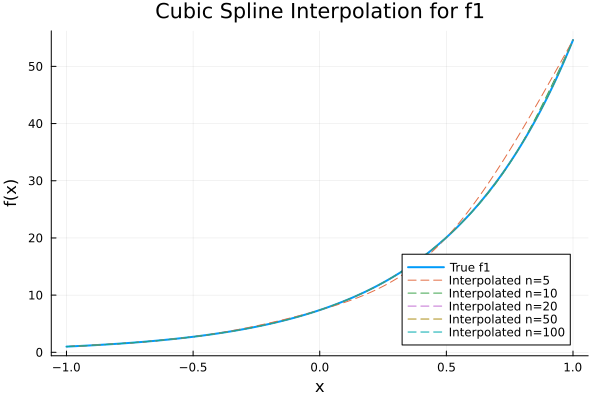

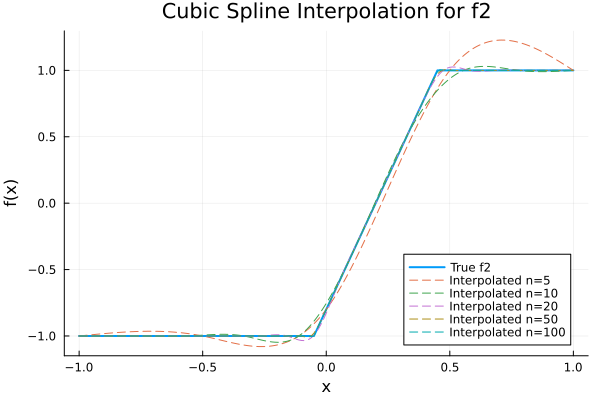

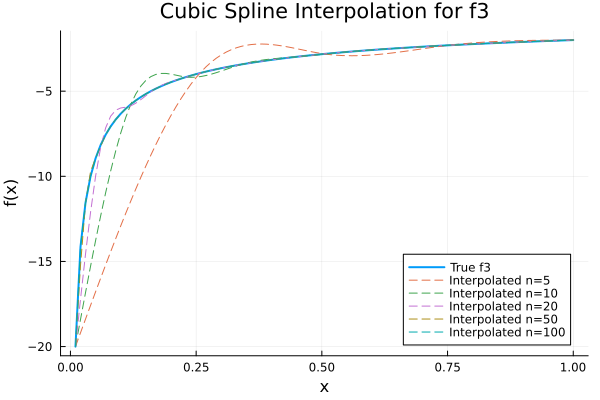

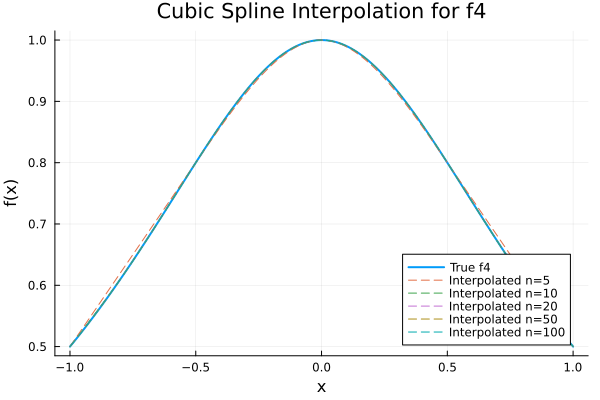

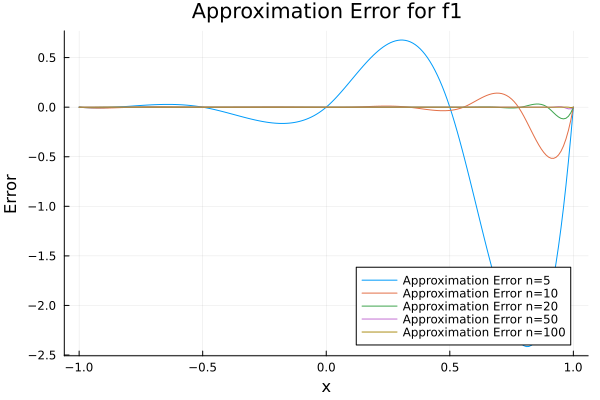

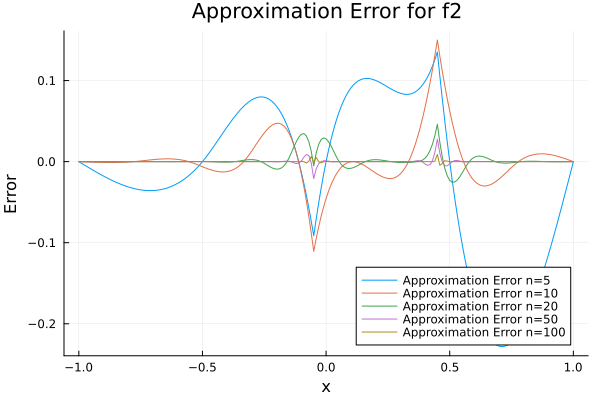

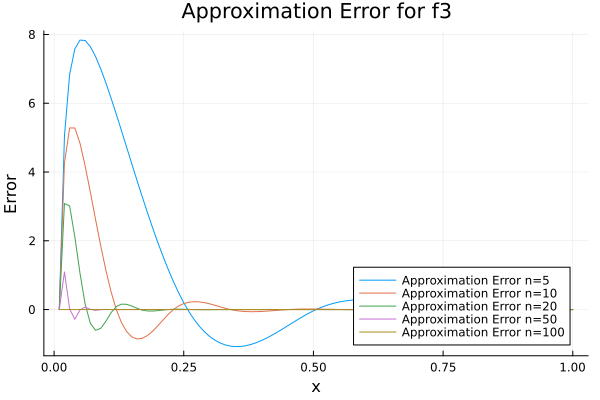

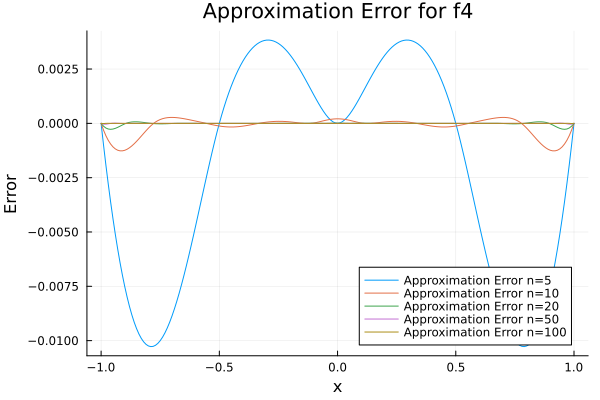

In [7]:
# Cubic splines

domains = Dict(
    "f1" => (-1, 1),
    "f2" => (-1, 1),
    "f3" => (0.01, 1),
    "f4" => (-1, 1)
)

errors = Dict()

for (f, label, (a, b)) in [(f1, "f1", domains["f1"]), (f2, "f2", domains["f2"]), (f3, "f3", domains["f3"]), (f4, "f4", domains["f4"])]
    a, b = domains[label]
    
    p = plot(title = "Cubic Spline Interpolation for $label", xlabel = "x", ylabel = "f(x)", legend=:bottomright)
    plot!(a:0.01:b, f, label="True $label", lw=2)
    
    for n in nodes
        X = LinRange(a, b, n)
        Y = f.(X)
        
        itp = CubicSplineInterpolation(X, Y)
        
        plot!(a:0.01:b, x -> itp(x), label="Interpolated n=$n", linestyle=:dash)
    end
    
    display(p)
end

for (f, label, (a, b)) in [(f1, "f1", domains["f1"]), (f2, "f2", domains["f2"]), (f3, "f3", domains["f3"]), (f4, "f4", domains["f4"])]
    a, b = domains[label]
    
    error_plot = plot(title = "Approximation Error for $label", xlabel = "x", ylabel = "Error", legend=:bottomright)
    
    for n in nodes
        X = LinRange(a, b, n)
        Y = f.(X)
        
        itp = CubicSplineInterpolation(X, Y)
        
        plot!(error_plot, a:0.01:b, x -> f(x) - itp(x), label="Approximation Error n=$n")
    end
    
    display(error_plot)
end

How well do the methods seem to be working?

Chebyshev polynomials are probably the best approximation for all functions because the approximation errors were usually small (except when n was small). Lagrange polynomial approximation was the worst, and basically didn't work for f1, f2, and f4 due to Runge's phenomenon. Linear interpolation and cubic splines were both good approximations for all functions.

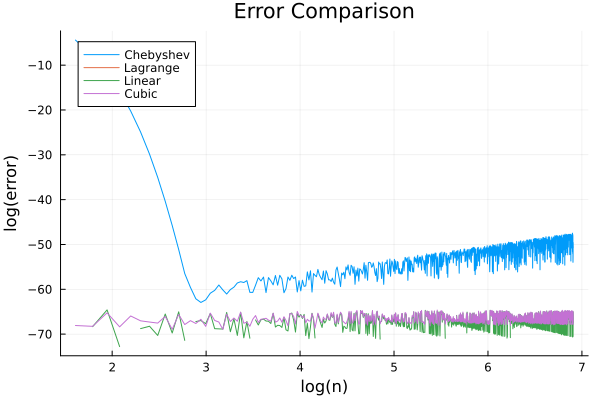

In [7]:
#1b

#Oh my god this has taken so long. Just part a has taken ages.

# Choose your favorite way to calculate the approximation error. Remember that if f : [a, b] → R, then ||f − fˆ||^2 = ∫{a}{b} (f(x) − fˆ(x))^2 dx.
# You will need to approximate this, either using your preferred numerical integration technique, or by taking an average. For instance, try generating a really fine grid over [a, b] (say, with 1000 points). Evaluate f and fˆ at these test points, and take the average of the squared difference between the true function and your approximation:
# ||f − fˆ||^2 ≈ frac{1}{1000} sum_{i=1}^{1000} (f(x_i) − fˆ(x_i))^2

# For each function fi, calculate the approximation e with each of the four methods you used in part (a) for n = 5, 6, 7, 8, . . . , 1000.
# Save the results in an array, and plot them against n.
# You will want to use a log-scale (i.e., log(n) on the x-axis, and log(e) on the y-axis).
# This will give you four plots, with four lines each.

# Hint: Think about the rates of convergence for these methods.

# Define the error calculation function
function calculate_error(f, f_hat, a, b, n)
    x = LinRange(a, b, n)
    error = sum((f.(x) .- f_hat.(x)).^2) / n
    return error
end

# Define the lower and upper bounds of the interval [a, b]
a = -1
b = 1

# Initialize arrays to store the errors
chebyshev_errors = []
lagrange_errors = []
linear_errors = []
cubic_errors = []

# Loop through different values of n
for n in 5:1000
    # Calculate the errors for each function and method
    x = LinRange(a, b, n)  # Define x as a range of values
    
    # Chebyshev error
    chebyshev_error = calculate_error(f1, x -> chebyshev_approximation(f1, n, x, a, b), a, b, n)
    push!(chebyshev_errors, chebyshev_error)
    
    # Lagrange error
    X = LinRange(a, b, n)
    Y = f1.(X)
    lagrange_error = calculate_error(f1, x -> lagrange_interpolate(X, Y, x), a, b, n)
    push!(lagrange_errors, lagrange_error)
    
    # Linear error
    linear_error = calculate_error(f1, x -> LinearInterpolation(X, Y)(x), a, b, n)
    push!(linear_errors, linear_error)
    
    # Cubic error
    cubic_error = calculate_error(f1, x -> CubicSplineInterpolation(X, Y)(x), a, b, n)
    push!(cubic_errors, cubic_error)
end

# Plot the errors against n using a log scale
plot(log.(5:1000), log.(chebyshev_errors), label="Chebyshev", xlabel="log(n)", ylabel="log(error)", title="Error Comparison")
plot!(log.(5:1000), log.(lagrange_errors), label="Lagrange")
plot!(log.(5:1000), log.(linear_errors), label="Linear")
plot!(log.(5:1000), log.(cubic_errors), label="Cubic")

#So - this code took 234 minutes to run. I'm not sure if it's correct, but I'm not going to run it again. 

The Chebyshev approximation method has the steepest negative slope in the graph, which may show that it has the fastest rate of convergence. This means that the error in the Chebyshev approximation reduces the fastest as the number of data points increases. The cubic spline interpolation method has a slower rate of convergence compared to Chebyshev approximation, but faster than linear interpolation. This is seen through the shallower negative slope of its curve in the graph. The linear interpolation method has the shallowest negative slope, which is the slowest rate of convergence among all four methods. As the number of data points increases, the error in the linear interpolation reduces slower than the other methods. The Lagrangian interpolation method is not shown on the graph (?????), but it is generally known to have a convergence rate that is even slower than linear interpolation. This means that the error in Lagrangian interpolation reduces very slowly as the number of data points increases.

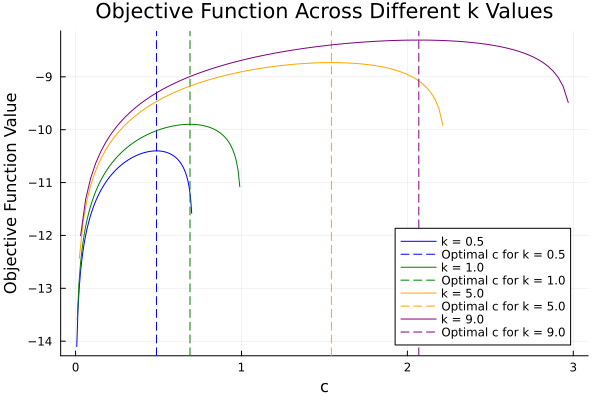

In [8]:
# 2a. Consider the function v(k) = a + b log(k) for some parameters a and b, and the corresponding
# maximization problem

# max log(c) + βv(k')
# s.t. c + k' = k^α
# 0 ≤ c ≤ k^α

# where α and β are also parameters.

#a) Start with a = −10, b = 0.5, α = 1/2 and β = 0.9. Write code that solves the equation for any choice of k. 
# Note that you will want to substitute the budget constraint into the objective so that you have an unconstrained problem.
# Try it out for k = 0.5, 1, 5, and 9, and find a sensible way to visualize the results. For instance, you could make a plot 
# of the objective function for each value of k, where you include a vertical line at the minimum you found

a = -10
b = 0.5
α = 0.5
β = 0.9

function v(k)
    return a + b * log(k)
end

function objective(c, k)
    k_prime = k^α - c
    # if c <= 0 || k_prime <= 0
    #     return -Inf  # return a large negative number
    # end
    return log(c) + β * (a + b * log(k_prime))
end

function maximize(k)
    opt_result = optimize(c -> -objective(c, k), 0, k^α, Brent())
    c_opt = opt_result.minimizer
    return c_opt, k^α - c_opt
end

k_values = [0.5, 1, 5, 9]
p = plot()

colors = [:blue, :green, :orange, :purple]

for (i, k) in enumerate(k_values)
    c_range = LinRange(0, k^α, 100)
    p = plot!(p, c_range, [objective(c, k) for c in c_range], label="k = $k", color=colors[i])
    c_opt, _ = maximize(k)
    p = vline!(p, [c_opt], label="Optimal c for k = $k", linestyle=:dash, color=colors[i])
end

xlabel!(p, "c")
ylabel!(p, "Objective Function Value")
title!(p, "Objective Function Across Different k Values")
display(p)

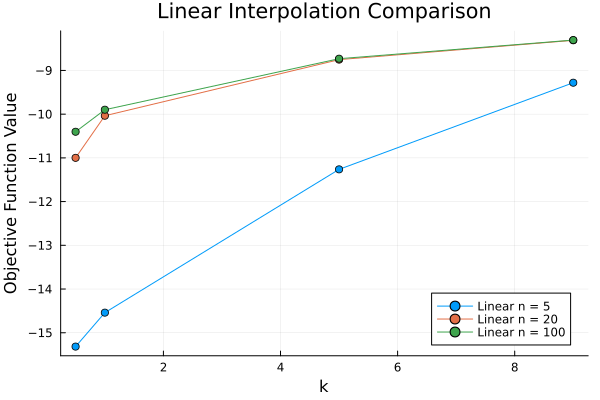

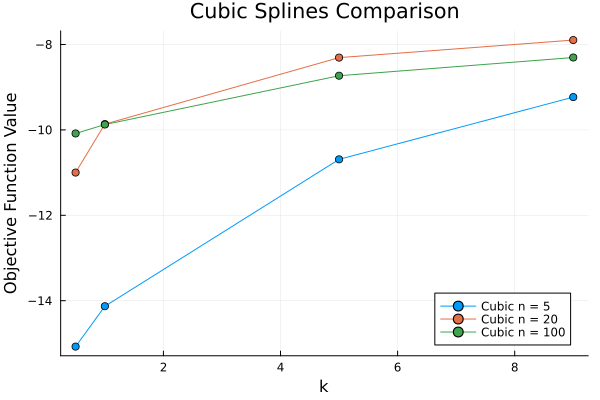

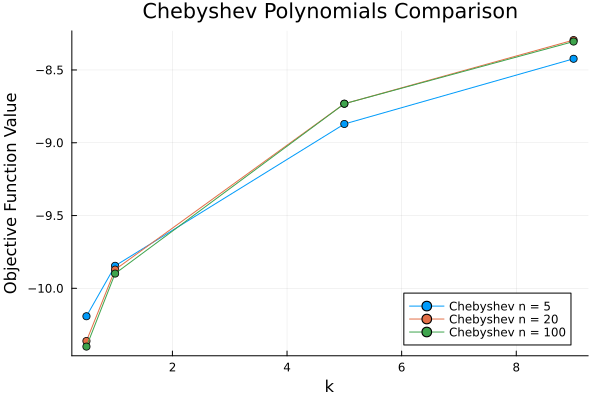

In [9]:
#2b Now, suppose you cannot use v directly in solving the equation (for instance, imagine that it is costly to evaluate).
# Instead, you must use an approximation ˆv. Approximate v using linear interpolation, cubic splines, and
# Chebyshev polynomials, for n = 5, 20 and 100. 
#Note: You will need to pick a domain for your approximation. I’d recommend using [10^−6, 10].

# Re-solve the equation using ˆv instead of v. Compare (and visualize) your results.

# max log(c) + βv(k')
# s.t. c + k' = k^α
# 0 ≤ c ≤ k^α


#I'm just going to write a new chebychev approximation function

function chebyshev_approximation2(f, n, x, a, b)
    x_scaled = 2 * (x - a) / (b - a) - 1
    x_scaled_clamped = max(min(x_scaled, 1), -1) #?? to avoid a problem with acos?
    c = chebyshev_coefficients(f, n, a, b)
    return sum([c[k+1] * T(k, x_scaled_clamped) for k = 0:n-1])
end

function objective(c, k, v_approx)
    k_prime = k^α - c
    return log(c) + β * v_approx(k_prime)
end

function maximize(k, v_approx)
    objective_with_approx = (c) -> -objective(c, k, v_approx)
    result = optimize(objective_with_approx, 1e-6, k^α, Brent())
    c_opt = Optim.minimizer(result)
    return c_opt, k^α - c_opt
end

domain = 10^-6:0.01:10

n_values = [5, 20, 100]

p_linear_comparison = plot(title = "Linear Interpolation Comparison", xlabel = "k", ylabel = "Objective Function Value", legend=:bottomright)
p_cubic_comparison = plot(title = "Cubic Splines Comparison", xlabel = "k", ylabel = "Objective Function Value", legend=:bottomright)
p_chebyshev_comparison = plot(title = "Chebyshev Polynomials Comparison", xlabel = "k", ylabel = "Objective Function Value", legend=:bottomright)

linear_points = Dict(n => [] for n in n_values)
cubic_points = Dict(n => [] for n in n_values)
cheby_points = Dict(n => [] for n in n_values)

for k in k_values
    for n in n_values
        points = LinRange(10^-6, 10, n)
        values = v.(points)
        linear_interp_func = LinearInterpolation(points, values, extrapolation_bc=Linear())
        cubic_spline_interp_func = CubicSplineInterpolation(points, values)
        cheby_approx_func = x -> chebyshev_approximation2(v, n, x, 10^-6, 10)
        
        c_opt_linear, _ = maximize(k, linear_interp_func)
        c_opt_cubic, _ = maximize(k, cubic_spline_interp_func)
        c_opt_chebyshev, _ = maximize(k, cheby_approx_func)
        
        # k is discrete so we can plot the objective function value for each k - might look a bit weird? Scatter plots look strange, connect a line between the points?
        push!(linear_points[n], (k, objective(c_opt_linear, k, linear_interp_func)))
        push!(cubic_points[n], (k, objective(c_opt_cubic, k, cubic_spline_interp_func)))
        push!(cheby_points[n], (k, objective(c_opt_chebyshev, k, cheby_approx_func)))
    end
end

function unzip(arr)
    if length(arr) == 1 && arr[1] isa Tuple
        return [arr[1][i] for i in 1:length(arr[1])]
    else
        return [getindex.(arr, i) for i in 1:length(first(arr))]
    end
end

for n in n_values
    x_values, y_values = unzip(linear_points[n])
    x_values = x_values isa Array ? x_values : [x_values]
    y_values = y_values isa Array ? y_values : [y_values]
    plot!(p_linear_comparison, x_values, y_values, marker=:circle, label="Linear n = $n", line=:true)

    x_values, y_values = unzip(cubic_points[n])
    x_values = x_values isa Array ? x_values : [x_values]
    y_values = y_values isa Array ? y_values : [y_values]
    plot!(p_cubic_comparison, x_values, y_values, marker=:circle, label="Cubic n = $n", line=:true)

    x_values, y_values = unzip(cheby_points[n])
    x_values = x_values isa Array ? x_values : [x_values]
    y_values = y_values isa Array ? y_values : [y_values]
    plot!(p_chebyshev_comparison, x_values, y_values, marker=:circle, label="Chebyshev n = $n", line=:true)
end

display(p_linear_comparison)
display(p_cubic_comparison)
display(p_chebyshev_comparison)

#oh my god it actually printed something

#???? I didn't change anything and the graphs changed? I don't know why?



# How similar are the optimized values? How close are the implied optimal choices of c and k'? 
# This question confuses me? 

Which approximation algorithm generates the best results (and why)?
The Chebyshev polynomials seem to generate the best results. They are the most accurate approximation of the function, and they have the least varying results across different n values.

What do you take away from this?
I take away that Chebyshev polynomials are the best approximation across different n values?

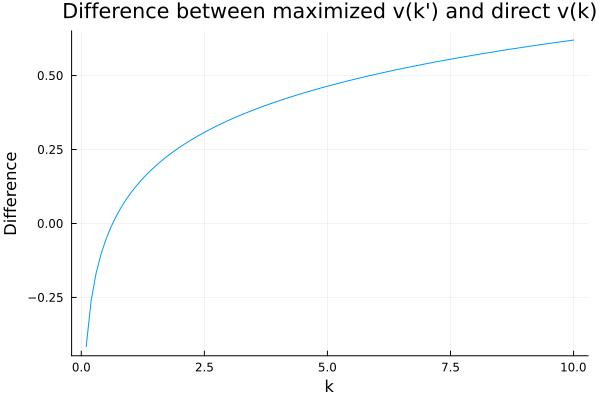

In [10]:
# 2c With the parameters you used in part (a), check whether or not this problem has the property that
# v(k) = max log(c) + βv(k´)
# s.t. c + k´ = k^α
# 0 ≤ c ≤ k^α
# You should verify this on a grid of points. Check it for every k on an evenly spaced grid of 100 points
# from 0.1 to 10. Plot the difference between your max values and the v you started with.

# So plot v(k') - v(k) for each k - the difference should be 0 or close to it if the problem has the property (I think)

a = -10
b = 0.5
α = 0.5
β = 0.9

function v(k)
    return a + b * log(k)
end

function objective(c, k)
    if c <= 0
        return -Inf
    end
    k_prime = k^α - c
    if k_prime <= 0
        return -Inf
    end
    return log(c) + β * v(k_prime)
end

function maximize(k)
    opt_result = optimize(c -> -objective(c, k), 1e-6, k^α, Brent())
    c_opt = Optim.minimizer(opt_result)
    max_value = -Optim.minimum(opt_result)
    return c_opt, max_value
end

k_values = LinRange(0.1, 10, 100)
differences = []

for k in k_values
    _, max_value = maximize(k)
    v_direct = v(k)
    difference = max_value - v_direct
    push!(differences, difference)
end

check = plot(k_values, differences, xlabel="k", ylabel="Difference", title="Difference between maximized v(k') and direct v(k)", legend=false)
display(check)

The values are somewhat near 0, but not exactly 0. The problem kind of has the property, but not exactly.

In [11]:
# 2.d Start from our initial guess a0 = −10 and b0 = 0.5, and try the following procedure:
# 1. For a given guess of (ai, bi), solve the equation 
# v(k) = max log(c) + βv(k´)
# s.t. c + k´ = k^α
# 0 ≤ c ≤ k^α
# for several values of k (call them ki) and store the maximum value that is attained at each point in a vector (call the values vi). 
# For this exercise, use an evenly spaced grid of 5 points from 0.1 to 10.

a0 = -10
b0 = 0.5
α = 0.5
β = 0.9

function v(k; a=a0, b=b0)
    return a + b * log(k)
end

function objective(c, k; a=a0, b=b0)
    k_prime = k^α - c
    return log(c) + β * v(k_prime; a=a, b=b)
end

k_values = LinRange(0.1, 10, 5)
v_values = []

for k in k_values
    opt_result = optimize(c -> -objective(c, k; a=a0, b=b0), 0, k^α, Brent())
    push!(v_values, -Optim.minimum(opt_result))
end

println(v_values)

# set of negative values for the results

# 2. Find the values of a and b that solve the problem: min ∑(vi − a − b log(ki))^2
# If you look closely, you can see that this is in fact a linear regression problem, as we are choosing parameters that minimize the
# sum of squared residual errors in the equation vi = a + b log(ki) + ei
# Here, we are approximating our function with a linear regression!

vi = Float64.(v_values)
ki = collect(Float64, k_values)

n = length(vi)

X = hcat(ones(n), log.(ki))
Y = vi

coefficients = (X' * X) \ (X' * Y)

a = coefficients[1]
b = coefficients[2]

println("a = ", a)
println("b = ", b)

# 3 Set (ai+1, bi+1) equal to the results from Step 2. If (ai+1, bi+1) is close enough (let’s say, within a tolerance of 10^−8) then stop. 
# Otherwise, go back to Step 1 and repeat.
# Define the tolerance

tolerance = 1e-8

a = a0
b = b0

diff_a = Inf
diff_b = Inf

while diff_a > tolerance || diff_b > tolerance
    a_prev = a
    b_prev = b
    
    v_values = []
    for k in k_values
        objective(c) = log(c) + β * v(k^α - c; a=a, b=b)
        opt_result = optimize(c -> -objective(c), 0, k^α, Brent())
        push!(v_values, -Optim.minimum(opt_result))
    end
    
    vi = Float64.(v_values)
    ki = collect(Float64, k_values)
    X = hcat(ones(n), log.(ki))
    Y = vi
    coefficients = (X' * X) \ (X' * Y)
    a = coefficients[1]
    b = coefficients[2]
    
    diff_a = abs(a - a_prev)
    diff_b = abs(b - b_prev)
end

println("Final values:")
println("a = ", a)
println("b = ", b)

Any[-11.56746981254578, -9.212354707891215, -8.724039143741829, -8.434878282414767, -8.228721427704414]
a = -9.898095620125098
b = 0.725
Final values:
a = -12.511614712436758
b = 0.9090909090909096
